<a href="https://colab.research.google.com/github/zsylvester/curvaturePy/blob/master/curvaturePy_colab.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Estimating curvature and migration rate in meandering rivers
Zoltan Sylvester, Bureau of Economic Geology, The University of Texas at Austin

zoltan.sylvester@beg.utexas.edu

This notebook uses two centerlines of the Purus River in Brazil, interpreted from two Landsat images, collected in 1987 and 2017, to illustrate how curvature and migration rate can be estimated. The centerlines have been resampled to a ~25.0 m sampling distance. We use dynamic time warping to calculate local migration rates; and the 'dp_python' package (https://github.com/dpwe/dp_python) has to be installed ('dp' stands for 'dynamic programming') - see below. I could only get this package to work in Python 2.

## Set things up

In [0]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
import pandas as pd
from scipy.signal import medfilt
import functools
from scipy.optimize import minimize, bisect
import os
import datetime

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fpeopleapi.readonly&response_type=code

Enter your authorization code:
··········
Mounted at /content/drive


In [4]:
cd drive

/content/drive


In [5]:
cd 'My Drive'

/content/drive/My Drive


In [0]:

dirname = './Data/centerlines/'
fnames = os.listdir(dirname)
fnames.sort()

In [66]:
fnames

['Purus_19870701.csv', 'Purus_20170804.csv']

## Read and plot centerlines

(696338.0328443999, 921561.5713976, -870881.4749223499, -821029.32201465)

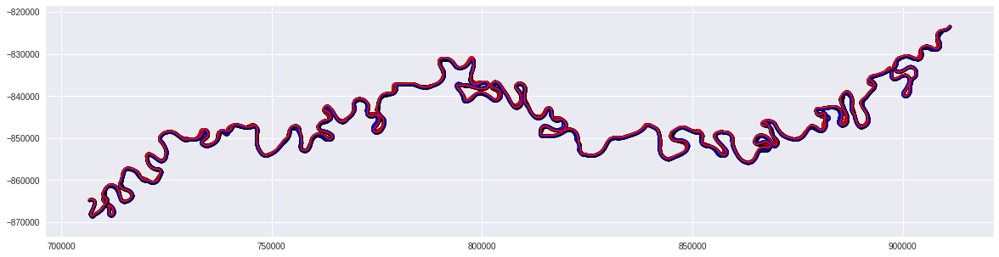

In [8]:
clxs = []
clys = []
ages = []
widths = []
rbxs = []
lbxs = []
rbys = []
lbys = []
curvatures = []
for i in range(0,len(fnames)):
    df = pd.read_csv(dirname+fnames[i])
    x = np.array(df['centerline_x'])
    y = np.array(df['centerline_y'])
    lbx = np.array(df['right_bank_x']) # left and right are switched in the CSV file! - fix this
    rbx = np.array(df['left_bank_x'])
    lby = np.array(df['right_bank_y'])
    rby = np.array(df['left_bank_y'])
    clxs.append(x)
    clys.append(y)
    rbxs.append(rbx)
    lbxs.append(lbx)
    rbys.append(rby)
    lbys.append(lby)
    curvatures.append(np.array(df['curvature']))
    ages.append(int(fnames[i][-12:-4]))
    widths.append(df['width (m)'])
plt.figure(figsize=(20,5))
for i in range(len(clxs)):
    plt.plot(clxs[i],clys[i],'k.-')
    plt.plot(rbxs[i],rbys[i],'b')
    plt.plot(lbxs[i],lbys[i],'r')
plt.axis('equal')

In [9]:
dates = []
for i in range(len(ages)):
    year = int(str(ages[i])[:4])
    month = int(str(ages[i])[4:6])
    day = int(str(ages[i])[6:])
    date = datetime.datetime(year, month, day)
    dates.append(date)
dates

[datetime.datetime(1987, 7, 1, 0, 0), datetime.datetime(2017, 8, 4, 0, 0)]

## Install dynamic time warping package

In [11]:
!git clone https://github.com/zsylvester/dp_python.git

fatal: destination path 'dp_python' already exists and is not an empty directory.


In [11]:
cd dp_python

/content/drive/My Drive/dp_python


In [13]:
!python setup.py build

running build
running build_ext


In [43]:
cd dp_python

/content/drive/My Drive/dp_python


In [0]:
cp _dpcore_py.so* .. # this file needs to be in the same folder as dpcore_py.c

In [15]:
pwd # to be able to import the 'dpcore' module, the current directory needs to be 'dp_python'

u'/content/drive/My Drive/dp_python'

## **Functions for computing curvature and migration rate**

In [0]:
from dpcore import dp 

def correlate_clines(x1,x2,y1,y2,penalty):
    """use dynamic time warping to correlate centerlines
    inputs:
    x1, y1 - coordinates of first centerline
    x2, y2 - coordinates of second centerline
    penalty - parameter that forces more parallel correlation (or not)
    outputs:
    p - indices of correlation in second centerline
    q - indices of correlation in first centerline
    sm - distance matrix"""
    c = len(x1)
    r = len(x2)
    sm = np.zeros((r,c))
    for i in range(0,r):
        sm[i,:] = ((x1-x2[i])**2 + (y1-y2[i])**2)**0.5
    p,q,C,phi = dp(sm,penalty=penalty,gutter=0.0)
    return p,q,sm
  
def get_migr_rate(x1,y1,x2,y2,years,penalty):
    """use dynamic time warping to correlate centerlines
    inputs:
    x1, y1 - coordinates of first centerline
    x2, y2 - coordinates of second centerline
    years - time between the two centerlines, in years
    penalty - parameter that forces more parallel correlation (or not)
    outputs:
    migr_rate - migration rate (in m/years)
    migr_sign - migration sign
    p - indices of correlation in second centerline
    q - indices of correlation in first centerline"""
    p,q,sm = correlate_clines(x1,x2,y1,y2,penalty)
    qn = np.delete(np.array(q),np.where(np.diff(q)==0)[0]+1)
    pn = np.delete(np.array(p),np.where(np.diff(q)==0)[0]+1)
    xa = x1[:-1]
    xb = x1[1:]
    ya = y1[:-1]
    yb = y1[1:]
    x = x2[pn][1:]
    y = y2[pn][1:]
    migr_sign = np.sign((x-xa)*(yb-ya) - (y-ya)*(xb-xa))
    migr_rate = migr_sign*sm[pn,qn][1:]/years
    migr_rate = np.hstack((0,migr_rate))
    return migr_rate, migr_sign, p, q
  
def compute_curvature(x,y):
    """compute curvature of curve defined by coordinates x and y
    curvature is returned in units of 1/(unit of x and y)
    s - distance along curve"""
    dx = np.gradient(x); dy = np.gradient(y)  # first derivatives    
    ds = np.sqrt(dx**2+dy**2)
    ddx = np.gradient(dx); ddy = np.gradient(dy) # second derivatives 
    curvature = (dx*ddy - dy*ddx) / ((dx**2 + dy**2)**1.5) # curvature
    s = np.cumsum(ds) # along-channel distance
    return curvature, s
  
def compute_derivatives(x,y):
    dx = np.gradient(x) # first derivatives
    dy = np.gradient(y)      
    ds = np.sqrt(dx**2+dy**2)
    s = np.cumsum(ds)
    return dx, dy, ds, s
  
def find_zero_crossings(curve):
    """find zero crossings of a curve
    input: 
    a one-dimensional array that describes the curve
    outputs: 
    loc_zero_curv - indices of zero crossings
    loc_max_curv - indices of maximum values"""
    n_curv = abs(np.diff(np.sign(curve)))
    n_curv[plt.mlab.find(n_curv==2)] = 1
    loc_zero_curv = plt.mlab.find(n_curv)
    loc_zero_curv = loc_zero_curv +1
    loc_zero_curv = np.hstack((0,loc_zero_curv,len(curve)-1))
    n_infl = len(loc_zero_curv)
    max_curv = np.zeros(n_infl-1)
    loc_max_curv = np.zeros(n_infl-1, dtype=int)
    for i in range(1, n_infl):
        if np.mean(curve[loc_zero_curv[i-1]:loc_zero_curv[i]])>0:
            max_curv[i-1] = np.max(curve[loc_zero_curv[i-1]:loc_zero_curv[i]])
        if np.mean(curve[loc_zero_curv[i-1]:loc_zero_curv[i]])<0:
            max_curv[i-1] = np.min(curve[loc_zero_curv[i-1]:loc_zero_curv[i]])
        max_local_ind = plt.mlab.find(curve[loc_zero_curv[i-1]:loc_zero_curv[i]]==max_curv[i-1])
        if len(max_local_ind)>1:
            loc_max_curv[i-1] = loc_zero_curv[i-1] + max_local_ind[0]
        elif len(max_local_ind)==1:
            loc_max_curv[i-1] = loc_zero_curv[i-1] + max_local_ind
        else:
            loc_max_curv[i-1] = 0
    return loc_zero_curv, loc_max_curv

def get_predicted_migr_rate(curvature,W,k,Cf,D,kl,s):
    """function for calculating predicted migration rate
    using the simplified Howard-Knutson model
    inputs:
    W - channel width (m)
    k - constant (=1)
    Cf - friction factor
    D - channel depth (m)
    kl - migration constant (m/year)
    s - along-channel distance (m)
    output:
    R1 - predicted migration rate"""
    ds = np.diff(s)
    alpha = k*2*Cf/D
    ns = len(s)
    R0 = kl*W*curvature # preallocate vector for nominal channel migration rate
    R1 = np.zeros(ns) # preallocate adjusted channel migration rate
    for i in range(0,len(R1)):
        si2 = np.hstack((0,np.cumsum(ds[i-1::-1])))  # distance along centerline, backwards from current point 
        G = np.exp(-alpha*si2) # weighting function   
        R1[i] = -1*R0[i] + 2.5*np.sum(R0[i::-1]*G)/np.sum(G) # actual migration rate (m/year)
    return R1

# function for optimizing for Cf:
def get_friction_factor(Cf,curvature,migr_rate,kl,W,k,D,s):
    R1 = get_predicted_migr_rate(curvature,W,k,Cf,D,kl,s)
    corr = correlate(R1, migr_rate)
    # delta time array to match xcorr:
    delta_t = np.arange(1-len(R1), len(R1))
    time_shift = delta_t[corr.argmax()]
    return time_shift # goal is to minimize the time shift

## Compute curvature and migration rate

In [13]:
cd ..

/content/drive/My Drive


In [0]:
ts1 = 0
ts2 = 1
d = dates[ts2]-dates[ts1]
years = d.days/365.0
x = np.array(clxs[ts1])
y = np.array(clys[ts1])
xn = np.array(clxs[ts2])
yn = np.array(clys[ts2])

migr_rate, migr_sign, p, q = get_migr_rate(x,y,xn,yn,years,penalty=0)

In [0]:
migr_rate = medfilt(savgol_filter(migr_rate,11,3),kernel_size=5) # smoothing
curv,s = compute_curvature(x,y)
curv = medfilt(savgol_filter(curv,71,3),kernel_size=5) # smoothing
loc_zero_curv, loc_max_curv = find_zero_crossings(curv) # zero crossings of the mean curvature
loc_zero_migr, loc_max_migr = find_zero_crossings(migr_rate) # zero crossings of the mean migration rate

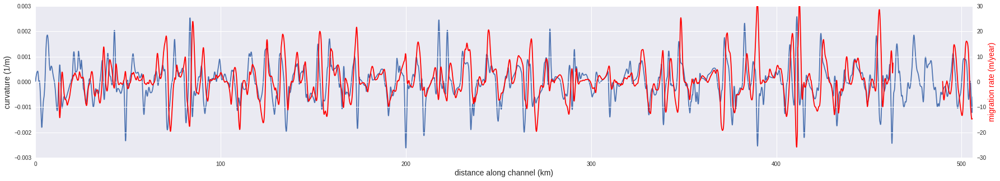

In [23]:
migr_rate[:502] = np.NaN # cutoff location
migr_rate[18550:19623] = np.NaN # cutoff location
fig = plt.figure(figsize=(30,5))
ax1 = fig.add_subplot(111)
ax1.plot(s/1000.0,curv)
ax1.set_xlim(0,max(s/1000.0))
ax1.set_ylabel('curvature (1/m)', fontsize=14)
ax2 = ax1.twinx()
ax2.plot(s/1000.0,migr_rate,'r')
ax1.set_xlabel('distance along channel (km)', fontsize=14)
ax2.set_ylabel('migration rate (m/year)', fontsize=14, color='r')
ax2.set_ylim(-30,30)
ax1.set_ylim(-0.003,0.003);

In [0]:
df = pd.read_csv('./Data/Purus_LT05_L1TP_001065_19870701_20170212_01_T1_inflection_and_zero_migration_indices.csv')
LZC = np.array(df['index of inflection point'])
LZM = np.array(df['index of zero migration'])

# indices of bends affected by low erodibility and cutoffs (these have been picked manually):
erodibility_inds = [12,14,27,42,46,69,73,76,86,95,101]
cutoff_inds = [18,19,21,22,63,64,97,98,99,100,114,115]

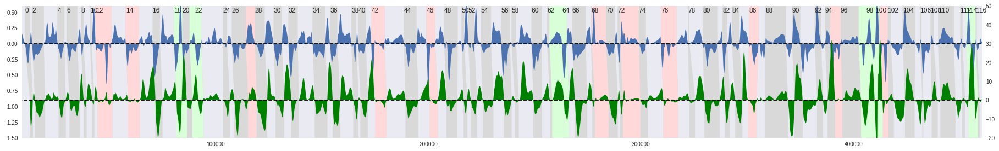

In [27]:
# plot curvature and migration rate along the channel

W = np.nanmean(widths[0])

fig, ax1 = plt.subplots(figsize=(25,4))
plt.tight_layout()
plt.grid('off')

y1 = 0.6
y2 = 0.0
y3 = -0.87
y4 = -1.5

for i in range(0,len(LZC)-1,2):
    xcoords = [s[LZC[i]],s[LZC[i+1]],s[LZC[i+1]],s[LZM[i+1]],s[LZM[i+1]],s[LZM[i]],s[LZM[i]],s[LZC[i]]]
    ycoords = [y1,y1,y2,y3,y4,y4,y3,y2]
    ax1.fill(xcoords,ycoords,color=[0.85,0.85,0.85],zorder=0)

offset = 10
deltas = 25.0
ax1.fill_between(s, 0, curv*W)
ax2 = ax1.twinx()
ax2.fill_between(s, 0, migr_rate, facecolor='green')

ax1.plot([0,max(s)],[0,0],'k--')
ax2.plot([0,max(s)],[0,0],'k--')
ax2.grid('off')

ax1.set_ylim(y4,y1)
ax2.set_ylim(-20,50)
ax1.set_xlim(8800,460280)

for i in erodibility_inds:
    xcoords = [s[LZC[i]],s[LZC[i+1]],s[LZC[i+1]],s[LZM[i+1]],s[LZM[i+1]],s[LZM[i]],s[LZM[i]],s[LZC[i]]]
    ycoords = [y1,y1,y2,y3,y4,y4,y3,y2]
    ax1.fill(xcoords,ycoords,color=[1.0,0.85,0.85],zorder=0) 
    
for i in cutoff_inds:
    xcoords = [s[LZC[i]],s[LZC[i+1]],s[LZC[i+1]],s[LZM[i+1]],s[LZM[i+1]],s[LZM[i]],s[LZM[i]],s[LZC[i]]]
    ycoords = [y1,y1,y2,y3,y4,y4,y3,y2]
    ax1.fill(xcoords,ycoords,color=[0.85,1.0,0.85],zorder=0) 
    
for i in range(len(LZC)-1):
    if np.sum(np.isnan(migr_rate[LZM[i]:LZM[i+1]]))>0:
        xcoords = [s[LZC[i]],s[LZC[i+1]],s[LZC[i+1]],s[LZM[i+1]],s[LZM[i+1]],s[LZM[i]],s[LZM[i]],s[LZC[i]]]
        ycoords = [y1,y1,y2,y3,y4,y4,y3,y2]
        ax1.fill(xcoords,ycoords,color='w') 
        
for i in range(len(LZC)-1):
    if np.sum(np.isnan(migr_rate[LZM[i]:LZM[i+1]]))>0:
        xcoords = [s[LZC[i]],s[LZC[i+1]],s[LZC[i+1]],s[LZM[i+1]],s[LZM[i+1]],s[LZM[i]],s[LZM[i]],s[LZC[i]]]
        ycoords = [35,35,20.7145,0,-15,-15,0,20.7145]
        ax2.fill(xcoords,ycoords,color='w') 

for i in range(0,len(LZC)-1,2):
    ax1.text(s[LZC[i]],0.5,str(i),fontsize=12)

## Estimate lag between curvature and migration rate

In [29]:
# use cross-correlation to find 'time' shift for which correlation between 
# curvature and migration rate is maximum

from scipy.signal import correlate

window_length = 500
delta_t = np.arange(-len(migr_rate[:window_length]), len(migr_rate[:window_length]))
time_shifts = []
i = 0
while i+window_length < len(curv):
    if np.sum(np.isnan(migr_rate[i:i+window_length]))>0: # get rid of windows with NaNs
        time_shifts.append(np.NaN)
    else:
        corr = correlate(curv[i:i+window_length], migr_rate[i:i+window_length])  
        time_shift = delta_t[corr.argmax()]
        time_shifts.append(time_shift)
    i = i+window_length
    
time_shifts = np.array(time_shifts)
time_shifts = time_shifts[np.isnan(time_shifts)==0] # get rid of NaNs

# get rid of outlier
time_shifts = np.delete(time_shifts,31)

# average lag
25.0*np.round(np.mean(time_shifts)) # sampling distance in centerlines is 25.0 m

-1000.0

In [30]:
# average lag estimated from distances between inflection points and points of zero migration 
# (this is what was used in the paper)

np.mean(25.0*(LZM-LZC))

1072.0588235294117

## Estimate friction factor Cf

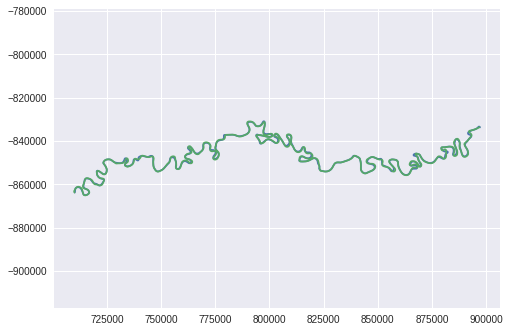

In [33]:
# first we need a continuous channel segment (e.g., no NaNs due to cutoffs)
q=np.array(q)
p=np.array(p)
         
i1 = 502
i2 = 18550
i1n = p[np.where(q==i1)[0][0]]
i2n = p[np.where(q==i2)[0][0]]

xt = x[i1:i2]
yt = y[i1:i2]
xnt = xn[i1n:i2n]
ynt = yn[i1n:i2n]

plt.figure()
plt.plot(xt,yt)
plt.plot(xnt,ynt)
plt.axis('equal')

migr_rate_t, migr_sign_t, pt, qt = get_migr_rate(xt,yt,xnt,ynt,years,0)

In [37]:
# this might take a while to run (~ a few minutes)
kl = 20.0 # preliminary kl value (guesstimate)
k = 1
D = (W/18.8)**0.7092 # depth in meters (from width); based on Konsoer et al.
dx,dy,ds,s = compute_derivatives(xt,yt)
curv_t, s = compute_curvature(xt,yt)
curv_t = medfilt(savgol_filter(curv_t,71,3),kernel_size=5) # smoothing
migr_rate_t = medfilt(savgol_filter(migr_rate_t,71,3),kernel_size=5)

get_friction_factor_1 = functools.partial(get_friction_factor,curvature=curv_t,migr_rate=migr_rate_t,
                                          kl=kl,W=W, k=k, D=D, s=s)

Cf_opt = bisect(get_friction_factor_1, 0.0002, 0.1)
print Cf_opt

0.003123828125


## Estimate migration rate constant kl

10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29


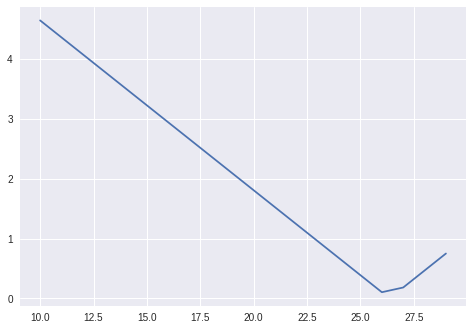

In [39]:
# minimize the error between actual and predicted migration rates (using the 75th percentile)
errors = []
curv_t, s = compute_curvature(xt,yt)
for i in np.arange(10,30):
    print i
    R1 = get_predicted_migr_rate(curv_t,W=W,k=1,Cf=Cf_opt,D=D,kl=i,s=s)
    errors.append(np.abs(np.percentile(np.abs(R1),75)-np.percentile(np.abs(migr_rate_t[1:-1]),75)))
    
plt.figure()
plt.plot(np.arange(10,30),errors)
plt.xlabel('migration rate constant (m/year)')
plt.ylabel('error (m)')

In [0]:
kl_opt = 26.0 # the error is at minimum for kl = 26.0

## Plot actual migration rate against nominal migration rate

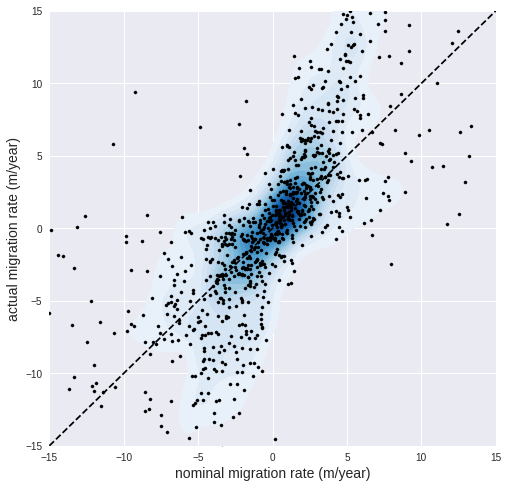

In [43]:
# kernel density and scatterplot of actual vs. nominal migration rate

import seaborn as sns

w = np.nanmedian(widths[0]) 
curv_nodim = w*curv*kl_opt
lag = 42 # = lag in meters / sampling rate
plt.figure(figsize=(8,8))
sns.kdeplot(curv_nodim[:-lag][np.isnan(migr_rate[lag:])==0], migr_rate[lag:][np.isnan(migr_rate[lag:])==0],
           n_levels=20,shade=True,cmap='Blues',shade_lowest=False)
plt.scatter(curv_nodim[:-lag][::20],migr_rate[lag:][::20],c='k',s=10)
max_x = 15
plt.xlim(-max_x,max_x)
plt.ylim(-max_x,max_x)
plt.plot([-max_x,max_x],[-max_x,max_x],'k--') 
plt.xlabel('nominal migration rate (m/year)', fontsize=14)
plt.ylabel('actual migration rate (m/year)', fontsize=14);

In [44]:
# get correlation coefficient for relationship between curvature and migration rate

from scipy import stats

slope, intercept, r_value, p_value, slope_std_rror = stats.linregress(curv_nodim[:-lag][np.isnan(migr_rate[lag:])==0],
                                                                      migr_rate[lag:][np.isnan(migr_rate[lag:])==0])
print r_value
print r_value**2
print p_value

0.7023008179973446
0.4932264389597393
0.0


In [45]:
# number of data points used in analysis
len(curv_nodim[:-lag][np.isnan(migr_rate[lag:])==0])

18700

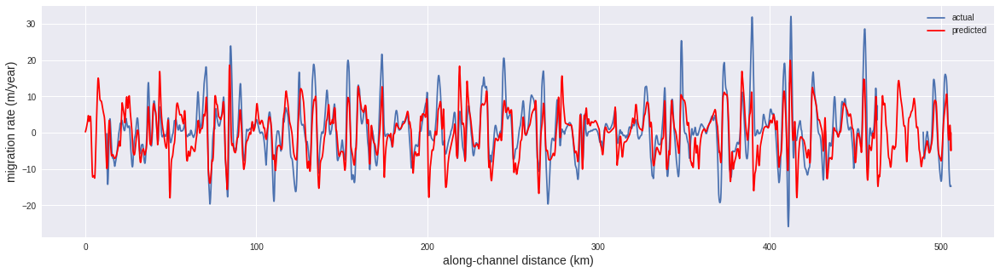

In [49]:
# compute predicted migration rates
dx,dy,ds,s = compute_derivatives(x,y)
R1 = get_predicted_migr_rate(curv,W=w,k=1,Cf=Cf_opt,D=D,kl=kl_opt,s=s)

# plot actual and predicted migration rates
plt.figure(figsize=(20,5))
plt.plot(s/1000.0,migr_rate)
plt.plot(s[1:-1]/1000.0,R1,'r')
plt.xlabel('along-channel distance (km)', fontsize=14)
plt.ylabel('migration rate (m/year)', fontsize=14)
plt.legend(['actual','predicted']);

In [50]:
# get correlation coefficient for relationship between actual and predicted migration rate

m_nonan = migr_rate[1:-1][(np.isnan(R1)==0)&(np.isnan(migr_rate[1:-1])==0)]
R_nonan = R1[(np.isnan(R1)==0)&(np.isnan(migr_rate[1:-1])==0)]

slope, intercept, r_value, p_value, slope_std_rror = stats.linregress(R_nonan,m_nonan)
print r_value
print r_value**2
print p_value

0.7034748321056272
0.49487683940604044
0.0


Text(0,0.5,u'actual migration rate (m/year)')

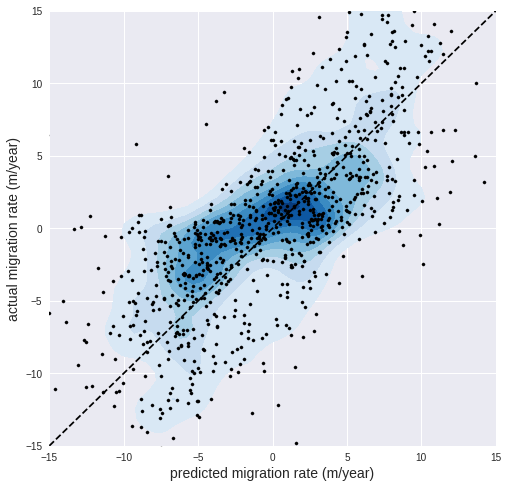

In [52]:
# plot actual vs. predicted migration rate

max_m = 15
plt.figure(figsize=(8,8))
sns.kdeplot(R_nonan,m_nonan,n_levels=10,shade=True,cmap='Blues',shade_lowest=False)
plt.plot([-max_m,max_m],[-max_m,max_m],'k--') 
plt.scatter(R_nonan[::20],m_nonan[::20],c='k',s=10)
plt.xlim(-max_m,max_m)
plt.ylim(-max_m,max_m)
plt.xlabel('predicted migration rate (m/year)', fontsize=14)
plt.ylabel('actual migration rate (m/year)', fontsize=14)

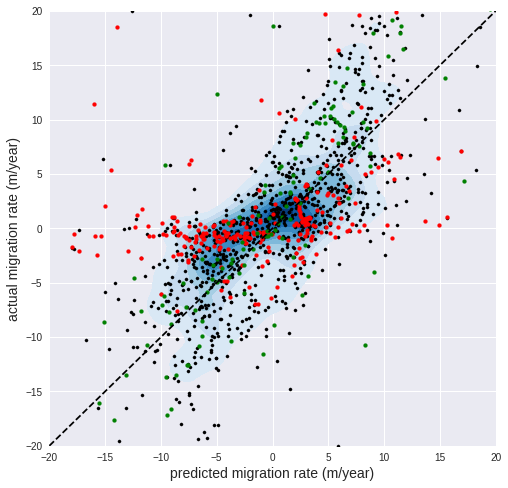

In [53]:
# plot actual vs. predicted migration rate
max_m = 20
plt.figure(figsize=(8,8))
sns.kdeplot(R_nonan,m_nonan,n_levels=10,shade=True,cmap='Blues',shade_lowest=False)
plt.plot([-max_m,max_m],[-max_m,max_m],'k--') 
plt.scatter(R_nonan[::20],m_nonan[::20],c='k',s=10)
plt.xlim(-max_m,max_m)
plt.ylim(-max_m,max_m)
plt.xlabel('predicted migration rate (m/year)', fontsize=14)
plt.ylabel('actual migration rate (m/year)', fontsize=14)

# add points affected by cutoffs and low erodibility
for i in erodibility_inds:
    plt.scatter(R1[LZC[i]:LZC[i+1]][::10],migr_rate[LZC[i]:LZC[i+1]][::10],c='r',s=15)
for i in cutoff_inds:
    plt.scatter(R1[LZC[i]:LZC[i+1]][::10],migr_rate[LZC[i]:LZC[i+1]][::10],c='g',s=15)

## Plot centerlines and migration vectors on satellite image

GDAL needs to be installed for this -- see installation at the end of notebook.

In [0]:
import cv2
import gdal

filepath = './Data/LT05_L1TP_001065_19870701_20170212_01_T1_true_color.tif'
TC = cv2.imread(filepath, cv2.IMREAD_UNCHANGED)
TC = cv2.cvtColor(TC, cv2.COLOR_BGR2RGB)

ds = gdal.Open(filepath)
geotransform = ds.GetGeoTransform()
ds = None # Close file

left_utm_x = geotransform[0]
upper_utm_y = geotransform[3]
delta_x = geotransform[1]
delta_y = geotransform[5]
nx = TC.shape[1]
ny = TC.shape[0]
right_utm_x = left_utm_x + delta_x*nx
lower_utm_y = upper_utm_y + delta_y*ny

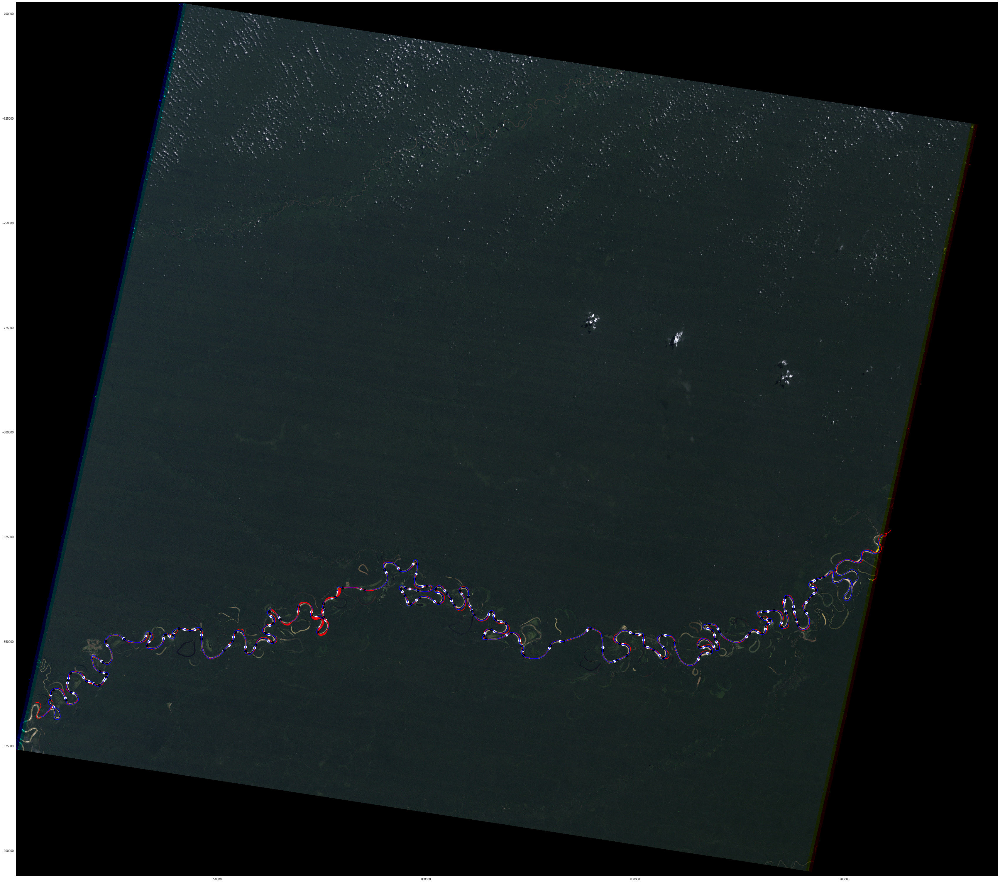

In [64]:
fig = plt.figure(figsize=(60,60)) # we want a *big* figure so that details are visible

plt.imshow(TC, extent=[left_utm_x,right_utm_x,lower_utm_y,upper_utm_y])
plt.grid('off')

plt.plot(x,y,'k')
plt.plot(xn,yn,'r')
plt.plot(x[LZC],y[LZC],'ow',markersize=10)
plt.plot(x[LZM],y[LZM],'ok',markersize=10)

dx,dy,ds,dummy = compute_derivatives(x,y)
xc = x + W*curv*kl*dy/ds*years # coordinates for 'nominal' migration
yc = y - W*curv*kl*dx/ds*years 
plt.plot(xc,yc,'b')

# plot migration vectors (only for a subset of points - otherwise it takes very long):
for i in range(6000,8000): #len(p)): 
    if (q[i]< len(x)-1):
        plt.plot([x[q[i]],xn[p[i]]],[y[q[i]],yn[p[i]]],'r',linewidth=0.5)

## Install GDAL (only needed for plotting centerlines on satellite image)

In [57]:
!apt update
!apt upgrade
!apt install python-gdal

Ign:1 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1710/x86_64  InRelease
Get:2 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic InRelease [21.3 kB]
Hit:3 http://archive.ubuntu.com/ubuntu bionic InRelease
Get:4 http://security.ubuntu.com/ubuntu bionic-security InRelease [83.2 kB]
Ign:5 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1604/x86_64  InRelease
Hit:6 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1710/x86_64  Release
Hit:7 https://developer.download.nvidia.com/compute/machine-learning/repos/ubuntu1604/x86_64  Release
Get:8 http://archive.ubuntu.com/ubuntu bionic-updates InRelease [88.7 kB]
Get:10 http://archive.ubuntu.com/ubuntu bionic-backports InRelease [74.6 kB]
Get:12 http://ppa.launchpad.net/graphics-drivers/ppa/ubuntu bionic/main amd64 Packages [27.0 kB]
Get:13 http://security.ubuntu.com/ubuntu bionic-security/main amd64 Packages [262 kB]
Get:14 http://archive.ubuntu.com/ubuntu bionic-updates/unive